In [6]:
import numpy as np
from matplotlib.animation import FuncAnimation
from scipy.integrate import solve_ivp
from IPython.display import HTML
np.random.seed(0)

# Parameters
L = 20  # Length of domain
N = 256  # Number of grid points
dx = L / N  # Grid spacing
x = np.linspace(0, L, N, endpoint=False)  # Spatial grid

# Function to create sinusoidal initial condition
def create_initial_condition():
    k1, k2 = 2, 1  # Wavenumbers
    phase1, phase2 = np.random.rand() * 2 * np.pi, np.random.rand() * 2 * np.pi
    amplitude1, amplitude2 = np.random.rand(), np.random.rand() * 0.5
    return amplitude1 * np.sin(2 * np.pi * k1 * x / L + phase1) + amplitude2 * np.sin(2 * np.pi * k2 * x / L + phase2)

# Define the Kuramoto-Sivashinsky equation
def kuramoto_sivashinsky(t, u):
    uxx = np.roll(u, 1) - 2 * u + np.roll(u, -1)
    uxxxx = np.roll(u, 2) - 4 * np.roll(u, 1) + 6 * u - 4 * np.roll(u, -1) + np.roll(u, -2)
    dudt = - uxx - uxxxx - 0.5 * (np.roll(u, -1) * np.roll(u, 1) - np.roll(u, -1) * np.roll(u, -2))
    return dudt

# Time grid
t_span = np.linspace(0, 200, 300)

# Solve the ODE system for multiple initial conditions
all_solutions = []
num_initial_conditions = 500

for _ in range(num_initial_conditions):
    u0 = create_initial_condition()
    sol = solve_ivp(kuramoto_sivashinsky, [t_span[0], t_span[-1]], u0, t_eval=t_span, method='RK45')
    all_solutions.append(sol.y.T)

all_solutions = np.array(all_solutions)
print(all_solutions.shape)


(500, 300, 256)


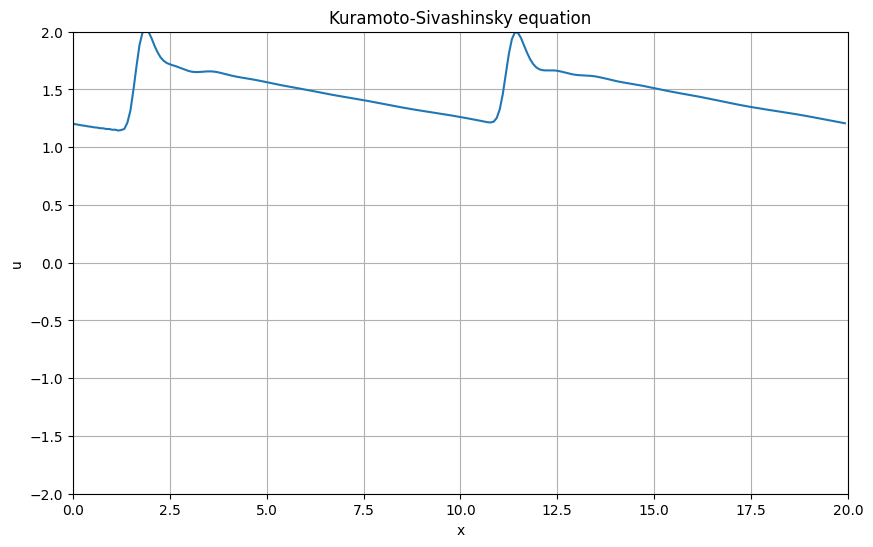

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6)) 
plt.title('Kuramoto-Sivashinsky equation')
plt.xlabel('x')
plt.ylabel('u')
plt.grid(True)
lines = plt.plot(x, all_solutions[0, 0])
plt.xlim(0, L)
plt.ylim(-2, 2)

def update(frame):
    for i, line in enumerate(lines):
        line.set_ydata(all_solutions[0, frame])
    return lines

ani = FuncAnimation(plt.gcf(), update, frames=len(t_span), blit=True)
HTML(ani.to_jshtml())

In [10]:
from sklearn.model_selection import train_test_split

nn_input = all_solutions[:, :-1].reshape(-1, 1, N)
nn_output = all_solutions[:, 1:].reshape(-1, N)
X_train, X_test, Y_train, Y_test = train_test_split(nn_input, nn_output, test_size=0.3, random_state=42)
print(X_train.shape, Y_train.shape, X_test.shape, Y_test.shape)

(104650, 1, 256) (104650, 256) (44850, 1, 256) (44850, 256)


Sequence length: 1, Feature size: 256


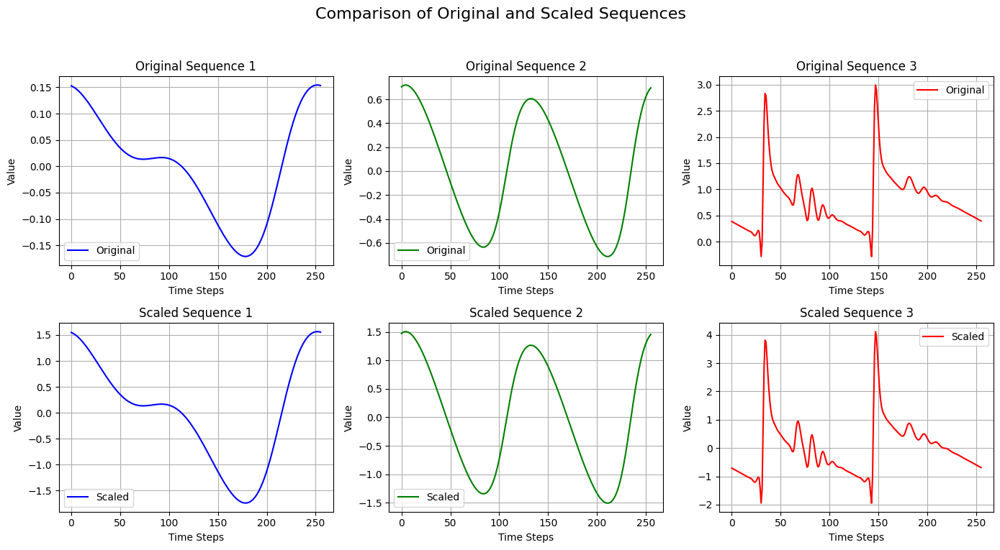

In [11]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Assuming X_train has shape (num_samples, sequence_length, feature_size)
sequence_length = X_train.shape[1]
feature_size = X_train.shape[2]
print(f'Sequence length: {sequence_length}, Feature size: {feature_size}')

# Create a figure with subplots
plt.figure(figsize=(14, 8))

# Plot the original sequences
plt.subplot(2, 3, 1)
plt.plot(X_train[0].ravel(), color='b', label='Original')
plt.title('Original Sequence 1')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.grid(True)
plt.legend()

plt.subplot(2, 3, 2)
plt.plot(X_train[1].ravel(), color='g', label='Original')
plt.title('Original Sequence 2')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.grid(True)
plt.legend()

plt.subplot(2, 3, 3)
plt.plot(X_train[2].ravel(), color='r', label='Original')
plt.title('Original Sequence 3')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.grid(True)
plt.legend()

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, feature_size).T).T.reshape(-1, sequence_length, feature_size)

# Plot the scaled sequences
plt.subplot(2, 3, 4)
plt.plot(X_train_scaled[0].ravel(), color='b', label='Scaled')
plt.title('Scaled Sequence 1')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.grid(True)
plt.legend()

plt.subplot(2, 3, 5)
plt.plot(X_train_scaled[1].ravel(), color='g', label='Scaled')
plt.title('Scaled Sequence 2')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.grid(True)
plt.legend()

plt.subplot(2, 3, 6)
plt.plot(X_train_scaled[2].ravel(), color='r', label='Scaled')
plt.title('Scaled Sequence 3')
plt.xlabel('Time Steps')
plt.ylabel('Value')
plt.grid(True)
plt.legend()

# Add a super title
plt.suptitle('Comparison of Original and Scaled Sequences', fontsize=16)

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for super title

# Show the plot
plt.show()


In [12]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, LSTM
try:
    from scikeras.wrappers import KerasRegressor
except ImportError:
    from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
    legacy_wrapper = True


def create_model(learning_rate):
    model = Sequential()
    model.add(Input(shape=(1, N)))
    model.add(LSTM(128, return_sequences=False))
    model.add(Dense(N))

    model.optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error')
    return model

model = KerasRegressor(build_fn=create_model, learning_rate=0.001, batch_size=256, epochs=50, verbose=1)
fitted_model = model.fit(X_train, Y_train)
if legacy_wrapper:
    fitted_model = fitted_model.model

Epoch 1/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.1959
Epoch 2/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0563
Epoch 3/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0432
Epoch 4/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0356
Epoch 5/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0307
Epoch 6/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0280
Epoch 7/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0259
Epoch 8/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0245
Epoch 9/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0232
Epoch 10/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0222
Epoch 11/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0212
Epoch 12/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0204
Epoch 13/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0199
Epoch 14/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0193
Epoch 15/50
409/409 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - lo

In [13]:
if not legacy_wrapper:
    score = fitted_model.score(X_test, Y_test)
    print(f'Score: {score}')

176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Score: 0.9743404840838455


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


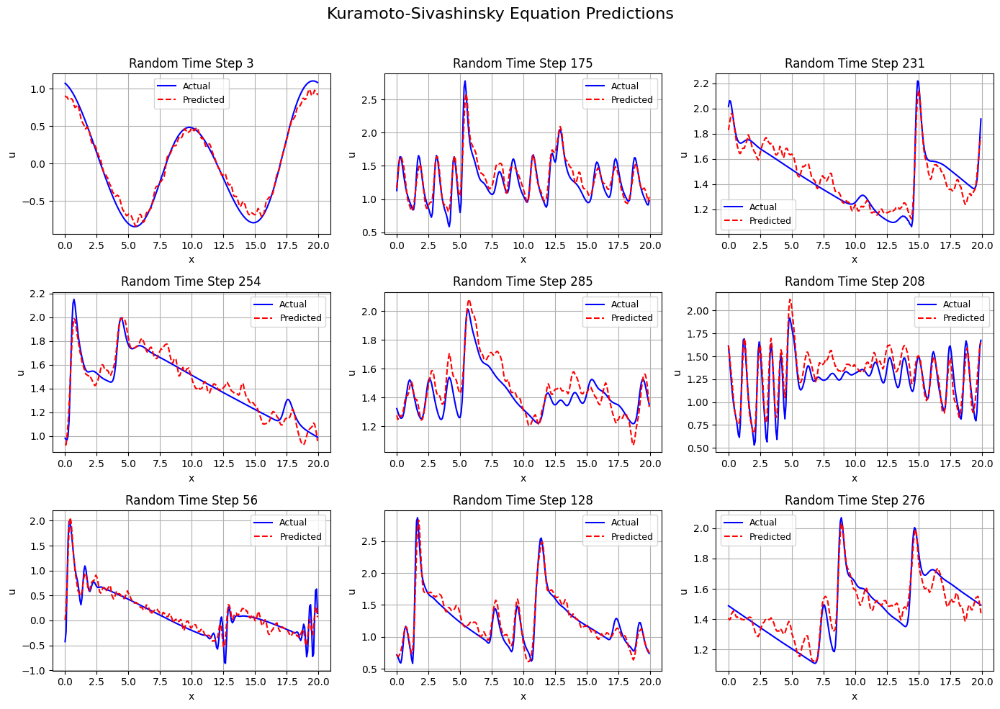

In [30]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 3, figsize=(14, 10))

for idx, ax in enumerate(axs.flatten()):
    u0 = create_initial_condition().reshape(1, -1)
    act_sol = solve_ivp(kuramoto_sivashinsky, [t_span[0], t_span[-1]], u0.flatten(), t_eval=t_span, method='RK45').y
    random_time_step = np.random.randint(0, len(t_span) - 1)
    u_guess = model.predict(act_sol[:, random_time_step].reshape(1, 1, N)).flatten()

    ax.plot(x, act_sol[:, random_time_step + 1].flatten(), label='Actual', color='b', linestyle='-', linewidth=1.5)
    ax.plot(x, u_guess.flatten(), label='Predicted', color='r', linestyle='--', linewidth=1.5)
    
    ax.set_title(f'Random Time Step {random_time_step}', fontsize=12)
    ax.set_xlabel('x', fontsize=10)
    ax.set_ylabel('u', fontsize=10)
    ax.legend(fontsize=9)
    ax.grid(True)

plt.suptitle('Kuramoto-Sivashinsky Equation Predictions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()
